## Genre Comparisons Using Waveplots and Spectrograms

Now that each snippet of each genre has been graphed into a spectrogram, I'd like to compare them, and see which ones look similar....or different. This visual test will help determine which genres I'd like to keep for classifying. I'm looking for patterns that are unique to it's genre. There's always going to be the problem of how genres, themselves, are classified... as what determines an actual genre is purely subjective, but, generally agreed upon. 

I'm going to take one snippet from each genre, run a waveplot as well as a couple different spectrograms, and compare them side-by-side, so I can make some visual comparisons.

In [1]:
import glob
import os
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
%matplotlib inline

In [2]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(30,80), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(15,2,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 1: Waveplot",x=.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(30,80), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(15,2,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 2: Spectrogram",x=.5, y=0.915,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(30,80), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(15,2,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: Log power spectrogram",x=.5, y=0.915,fontsize=18)
    plt.show()

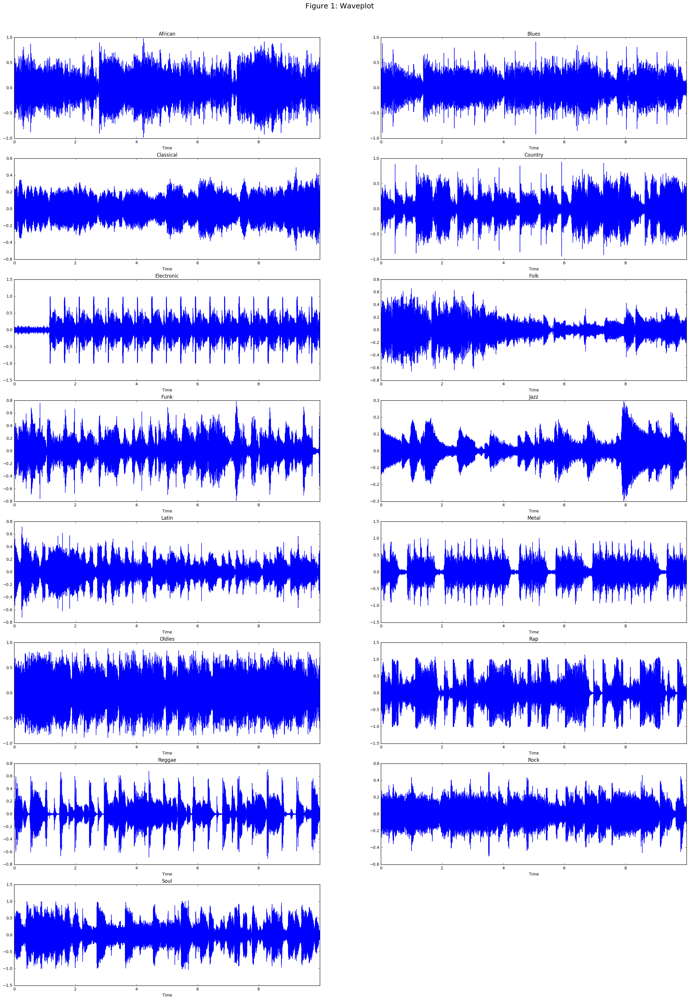

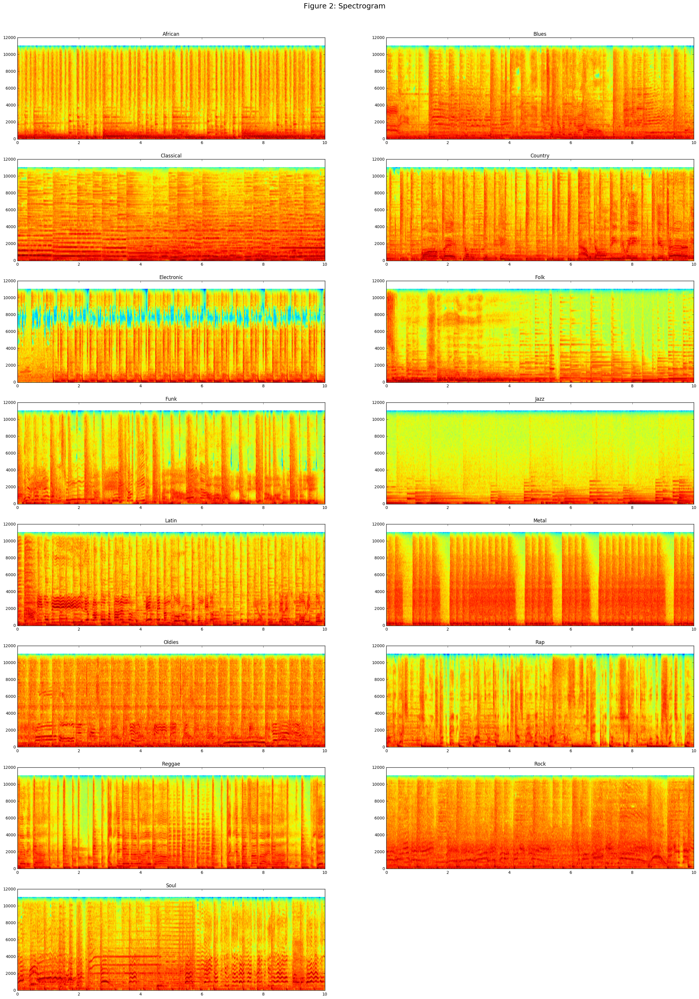

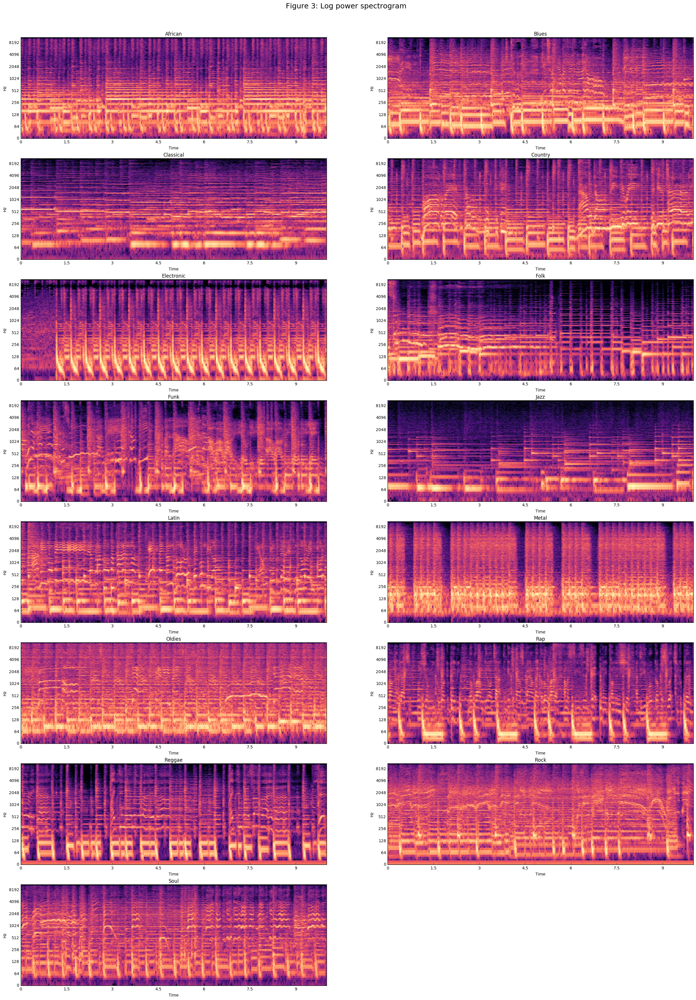

In [35]:
sound_file_paths = ["/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/African/African Woman.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Blues/Shame Shame.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Classical/Brandenburg Concerto 2 Fmaj-Andante.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Country/Coward Of The County.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Electronic/House Mix.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Folk/Lets Get Lost.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Funk/Atomic Dog.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Jazz/Blue In Green.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Latin/Amor Verdadero.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Metal/Am I Evil.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Oldies/The Twist.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Rap/Candy Shop.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Reggae/Buffalo Soldier.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Rock/Back In Black.wav",\
                    "/Users/ginodefalco/dsi/dsi-workspace/projects2/project-captsone/Music/Soul/Think Freedom.wav"]

sound_names = ["African","Blues","Classical",
               "Country","Electronic","Folk", "Funk",
               "Jazz","Latin","Metal", "Oldies", "Rap", "Reggae",
               "Rock", "Soul"]

raw_sounds = load_sound_files(sound_file_paths)

plot_waves(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)
plot_log_power_specgram(sound_names,raw_sounds)

### So, what do we notice here?

**Waveplots** : 
   - African, Blues and Rock look similar 
   - Electronic, Metal and Reggae have similarities
   - Soul and Folk show many similarities
   
**Spectrograms** :
   - Funk, Rap and Reggae look similar
   - Blues, Country and Rock have similarities
   - Latin and African are similar
   - Electronic, Jazz and Metal are unique
   
#### After further review, I've decided to use the following five genres to use for song->genre classification:

   - Electronic
   - Jazz
   - Metal
   - Oldies
   - Reggae
   
I felt like these genres were the most different from each other after comparing them visually and comparing the features extracted from them.
                

### Next Step: Feature Extraction

So, I will now choose 100 songs from each of those genres from my local song library, and further split those songs into 10 second snippets. I'm going to extract audio features in the form of an array from these 10 second snippets, and feed them into a neural network, in order to train our model to recognize genres. 